# **Credit Default Payment Prediction Algorithm with Machine Learning**
![](https://i.imgur.com/UCd4GGx.jpeg)

Credit default remains a significant concern within the financial landscape, impacting businesses and individuals alike. Timely prediction of credit default holds the potential to mitigate financial risks and optimize lending decisions. This report is centered around developing a machine learning-driven framework for credit default prediction based on relevant financial attributes. The objective is to construct an accurate and efficient system capable of assisting financial institutions in evaluating the likelihood of credit default. By analysing a range of financial parameters, this study aims to forecast whether a credit applicant is prone to defaulting, employing a suite of machine learning classification models including Logistic Regression, Decision Trees, Random Forest, and more.

Predicting credit default based on Age, Monthly Income, Debt Ratio & etc.

In this notebook we will explore Supervised Machine Learning methods. Regression models such as linear regression, decision tree and ensemble models such as RandomForest will trained to predict Credit default using Scikit Learn. We will use Pandas, Numpy, Matplotlib, Seaborn and Plotly to perform exploratory data analysis and gather insights for machine learning. We will do the following:-

1. Installation and importation of necessary libraries.
2. Exploration of the dataset and merging of different files, if needed.
3. Translation of the business problem into a machine learning problem.
4. Conducting exploratory data analysis (EDA).
5. Performing feature engineering.
6. Preparing the data, which includes tasks such as train-validation splitting, encoding, imputing, and scaling.
7. Selection of relevant input features.
8. Definition of evaluation metrics.
9. Establishment of a baseline model.
10. Selection of the best model without hyperparameter tuning.
11. Hyperparameter tuning for selected models.
12. Generating predictions.
13. Summarizing insights and key learnings.
By following this comprehensive approach, we aim to extract meaningful information and draw valuable conclusions from our dataset.

# **Machine leanring Theory**
Machine Learning model is system that has been trained from features to recognize the pattern and give out a label as an output. In the training set the model tend to learn a general theme around the data and based on the kind of model choosen, alligns the weights to several features in a way to predict the target variable.

**Supervised vs. Unsupervised**

Supervised machine learning is where the target lables are known. That is, there is a clear distinction between the explainatory and explained variables. While in case of unsupervised models, the tools and techniques are used to get a basic pattern from the data clusters and bifurcate the data on the basis of difference in features.

**Regression vs. Classification**

Both are a part of supervised ML problems. The difference is that in case of classification problem there are finite and distince lables for the target variables, while for regression problem the target is a continuous variable.

**Linear vs. Tree based models**

Linear models are the ones which work on the priciples of linear relationships between the explained and explainatory variables. They Linear models can be expressed in the form of linear equations.

Tree based models on the other hand works on the priciples of information gain. The nodes are divided into subnodes on the basis of how the gini decreases (information gained) when we split the data at some point on the variable.

### Installing and Importing Libraries

In [125]:
#install the all libraries
!pip install pandas --upgrade --quiet
!pip install numpy --upgrade --quiet
!pip install opendatasets --upgrade --quiet
!pip install seaborn --upgrade --quiet
!pip install matplotlib --upgrade --quiet
!pip install scikit-learn --upgrade --quiet

In [126]:
#import the libraries
import pandas as pd
import numpy as np
import opendatasets as od
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import os
%matplotlib inline

In [127]:
#set the style of of graphs
matplotlib.rcParams['font.size']=14
matplotlib.rcParams['figure.figsize'] = (10,6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

### Exploring the dataset

Download and Extract Data

In [128]:
#save the data's url into a variable
data_url = "https://www.kaggle.com/c/GiveMeSomeCredit/data?select=cs-test.csv"

In [129]:
#download the dataset
od.download(data_url)

Skipping, found downloaded files in "./GiveMeSomeCredit" (use force=True to force download)


In [130]:
#checking the data files
os.listdir('/content/GiveMeSomeCredit')

['sampleEntry.csv', 'cs-test.csv', 'Data Dictionary.xls', 'cs-training.csv']

In [131]:
#save the data into a Pandas Dataframe
raw_df = pd.read_csv("/content/GiveMeSomeCredit/cs-training.csv")

In [132]:
raw_df[:5]

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
0,1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


In [133]:
#checking the info of dataset
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150000 entries, 0 to 149999
Data columns (total 12 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   Unnamed: 0                            150000 non-null  int64  
 1   SeriousDlqin2yrs                      150000 non-null  int64  
 2   RevolvingUtilizationOfUnsecuredLines  150000 non-null  float64
 3   age                                   150000 non-null  int64  
 4   NumberOfTime30-59DaysPastDueNotWorse  150000 non-null  int64  
 5   DebtRatio                             150000 non-null  float64
 6   MonthlyIncome                         120269 non-null  float64
 7   NumberOfOpenCreditLinesAndLoans       150000 non-null  int64  
 8   NumberOfTimes90DaysLate               150000 non-null  int64  
 9   NumberRealEstateLoansOrLines          150000 non-null  int64  
 10  NumberOfTime60-89DaysPastDueNotWorse  150000 non-null  int64  
 11  

**MonthlyIncome** and **NumberOfDependents** have some missing values which is a problem as these two columns are important in determining the percentage of credit default.


In [134]:
raw_df.isna().sum()

Unnamed: 0                                  0
SeriousDlqin2yrs                            0
RevolvingUtilizationOfUnsecuredLines        0
age                                         0
NumberOfTime30-59DaysPastDueNotWorse        0
DebtRatio                                   0
MonthlyIncome                           29731
NumberOfOpenCreditLinesAndLoans             0
NumberOfTimes90DaysLate                     0
NumberRealEstateLoansOrLines                0
NumberOfTime60-89DaysPastDueNotWorse        0
NumberOfDependents                       3924
dtype: int64

Here we can see that the exact number of missing values in **MonthlyIncome** and **NumberOfDependents**.

In [135]:
#save test dataset into Pandas Dataframe
test_df = pd.read_csv("/content/GiveMeSomeCredit/cs-test.csv")

In [136]:

#checking the test dataset info
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101503 entries, 0 to 101502
Data columns (total 12 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   Unnamed: 0                            101503 non-null  int64  
 1   SeriousDlqin2yrs                      0 non-null       float64
 2   RevolvingUtilizationOfUnsecuredLines  101503 non-null  float64
 3   age                                   101503 non-null  int64  
 4   NumberOfTime30-59DaysPastDueNotWorse  101503 non-null  int64  
 5   DebtRatio                             101503 non-null  float64
 6   MonthlyIncome                         81400 non-null   float64
 7   NumberOfOpenCreditLinesAndLoans       101503 non-null  int64  
 8   NumberOfTimes90DaysLate               101503 non-null  int64  
 9   NumberRealEstateLoansOrLines          101503 non-null  int64  
 10  NumberOfTime60-89DaysPastDueNotWorse  101503 non-null  int64  
 11  

In [137]:
test_df.isna().sum()

Unnamed: 0                                   0
SeriousDlqin2yrs                        101503
RevolvingUtilizationOfUnsecuredLines         0
age                                          0
NumberOfTime30-59DaysPastDueNotWorse         0
DebtRatio                                    0
MonthlyIncome                            20103
NumberOfOpenCreditLinesAndLoans              0
NumberOfTimes90DaysLate                      0
NumberRealEstateLoansOrLines                 0
NumberOfTime60-89DaysPastDueNotWorse         0
NumberOfDependents                        2626
dtype: int64

Now we know the excet number of null values of **MonthlyIncome** and **NumberOfDependents** in test datasets

In [138]:
round(raw_df.describe().T,2)

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,150000.0,75000.50,43301.41,1.0,37500.75,75000.50,112500.25,150000.0
SeriousDlqin2yrs,150000.0,0.07,0.25,0.0,0.00,0.00,0.00,1.0
RevolvingUtilizationOfUnsecuredLines,150000.0,6.05,249.76,0.0,0.03,0.15,0.56,50708.0
age,150000.0,52.30,14.77,0.0,41.00,52.00,63.00,109.0
NumberOfTime30-59DaysPastDueNotWorse,150000.0,0.42,4.19,0.0,0.00,0.00,0.00,98.0
DebtRatio,150000.0,353.01,2037.82,0.0,0.18,0.37,0.87,329664.0
MonthlyIncome,120269.0,6670.22,14384.67,0.0,3400.00,5400.00,8249.00,3008750.0
NumberOfOpenCreditLinesAndLoans,150000.0,8.45,5.15,0.0,5.00,8.00,11.00,58.0
NumberOfTimes90DaysLate,150000.0,0.27,4.17,0.0,0.00,0.00,0.00,98.0
NumberRealEstateLoansOrLines,150000.0,1.02,1.13,0.0,0.00,1.00,2.00,54.0


In [139]:
#checking the datasets columns
raw_df.columns

Index(['Unnamed: 0', 'SeriousDlqin2yrs',
       'RevolvingUtilizationOfUnsecuredLines', 'age',
       'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
       'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate',
       'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
       'NumberOfDependents'],
      dtype='object')

In [140]:
#saving the data dictionery into Pandas dataframe
dicti = pd.read_excel("/content/GiveMeSomeCredit/Data Dictionary.xls")

In [141]:
dicti

,Unnamed: 0,Unnamed: 1,Unnamed: 2
0,Variable Name,Description,Type
1,SeriousDlqin2yrs,Person experienced 90 days past due delinquenc...,Y/N
2,RevolvingUtilizationOfUnsecuredLines,Total balance on credit cards and personal lin...,percentage
3,age,Age of borrower in years,integer
4,NumberOfTime30-59DaysPastDueNotWorse,Number of times borrower has been 30-59 days p...,integer
5,DebtRatio,"Monthly debt payments, alimony,living costs di...",percentage
6,MonthlyIncome,Monthly income,real
7,NumberOfOpenCreditLinesAndLoans,Number of Open loans (installment like car loa...,integer
8,NumberOfTimes90DaysLate,Number of times borrower has been 90 days or m...,integer
9,NumberRealEstateLoansOrLines,Number of mortgage and real estate loans inclu...,integer


In [142]:
#taking the column name from train dataset
for col in raw_df.columns:
#taking column name from data dictionary
  for index, new in enumerate(dicti['Unnamed: 0']):
    if col == new:
      #printing column name and description of that column
      print(f"{col} - {dicti['Unnamed: 1'].iloc[index]}")

SeriousDlqin2yrs - Person experienced 90 days past due delinquency or worse 
RevolvingUtilizationOfUnsecuredLines - Total balance on credit cards and personal lines of credit except real estate and no installment debt like car loans divided by the sum of credit limits
age - Age of borrower in years
NumberOfTime30-59DaysPastDueNotWorse - Number of times borrower has been 30-59 days past due but no worse in the last 2 years.
DebtRatio - Monthly debt payments, alimony,living costs divided by monthy gross income
MonthlyIncome - Monthly income
NumberOfOpenCreditLinesAndLoans - Number of Open loans (installment like car loan or mortgage) and Lines of credit (e.g. credit cards)
NumberOfTimes90DaysLate - Number of times borrower has been 90 days or more past due.
NumberRealEstateLoansOrLines - Number of mortgage and real estate loans including home equity lines of credit
NumberOfTime60-89DaysPastDueNotWorse - Number of times borrower has been 60-89 days past due but no worse in the last 2 year

### **Feature Engineering**

In [144]:
#filling the missing values with median
def data(df):
  df['MonthlyIncome'].fillna(df['MonthlyIncome'].median(),inplace=True)

  #creating a bin
  bins = [0,2000,5000,10000,20000,np.inf]

  #creating labels name
  bin_labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

  #creating a column in dataset
  df['Income_group'] = pd.cut(df['MonthlyIncome'], bins=bins, labels=bin_labels,right=False)

In [145]:
#creating a new column in the dataset
data(raw_df)
data(test_df)

<ipython-input-144-b6efe115f5b5>:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-144-b6efe115f5b5>:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or d

In [146]:
#checking the dataset
test_df

,Unnamed: 0,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,Income_group
0,1,NaN,0.885519,43,0,0.177513,5700.0,4,0,0,0,0.0,Medium
1,2,NaN,0.463295,57,0,0.527237,9141.0,15,0,4,0,2.0,Medium
2,3,NaN,0.043275,59,0,0.687648,5083.0,12,0,1,0,2.0,Medium
3,4,NaN,0.280308,38,1,0.925961,3200.0,7,0,2,0,0.0,Low
4,5,NaN,1.000000,27,0,0.019917,3865.0,4,0,0,0,1.0,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...
101498,101499,NaN,0.282653,24,0,0.068522,1400.0,5,0,0,0,0.0,Very Low
101499,101500,NaN,0.922156,36,3,0.934217,7615.0,8,0,2,0,4.0,Medium
101500,101501,NaN,0.081596,70,0,836.000000,5400.0,3,0,0,0,NaN,Medium
101501,101502,NaN,0.335457,56,0,3568.000000,5400.0,8,0,2,1,3.0,Medium


# **Data Preprocessing**

In [147]:
#importing the library
from sklearn.impute import SimpleImputer

In [148]:
#Droping the unwanted column
raw_df= raw_df.drop(columns='Unnamed: 0',axis=1)
test_df= test_df.drop(columns='Unnamed: 0',axis=1)

**"Unnamed: 0"** is a unwanted column which is not important.

In [149]:
#creating a list of columns in which missing values are present
columns_data_mis = ['MonthlyIncome','NumberOfDependents']

#imputing the strategy
imputer = SimpleImputer(strategy='median')

#transform the imputer into raw dataFrame
raw_df[columns_data_mis] = imputer.fit_transform(raw_df[columns_data_mis])

In [150]:
#checking the num values
raw_df.isna().sum()

SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfTime60-89DaysPastDueNotWorse    0
NumberOfDependents                      0
Income_group                            0
dtype: int64

In [151]:
#imputing the median
imputer = SimpleImputer(strategy='median')
test_df[columns_data_mis] = imputer.fit_transform(test_df[columns_data_mis])

In our test data, we imputed the all missing values but why **SeriousDlqin2yrs** wasn't imputed and the reason might be because it contain NaN values.

In [152]:
#checking the dataset
test_df.isna().sum()

SeriousDlqin2yrs                        101503
RevolvingUtilizationOfUnsecuredLines         0
age                                          0
NumberOfTime30-59DaysPastDueNotWorse         0
DebtRatio                                    0
MonthlyIncome                                0
NumberOfOpenCreditLinesAndLoans              0
NumberOfTimes90DaysLate                      0
NumberRealEstateLoansOrLines                 0
NumberOfTime60-89DaysPastDueNotWorse         0
NumberOfDependents                           0
Income_group                                 0
dtype: int64

Now, Our training data look great, and there are no missing value in the dataset.

In [153]:
#creating a variable to save income group count values
income=raw_df['Income_group'].value_counts()
print(income)

Income_group
Medium       77113
Low          42215
High         17456
Very Low     10887
Very High     2329
Name: count, dtype: int64


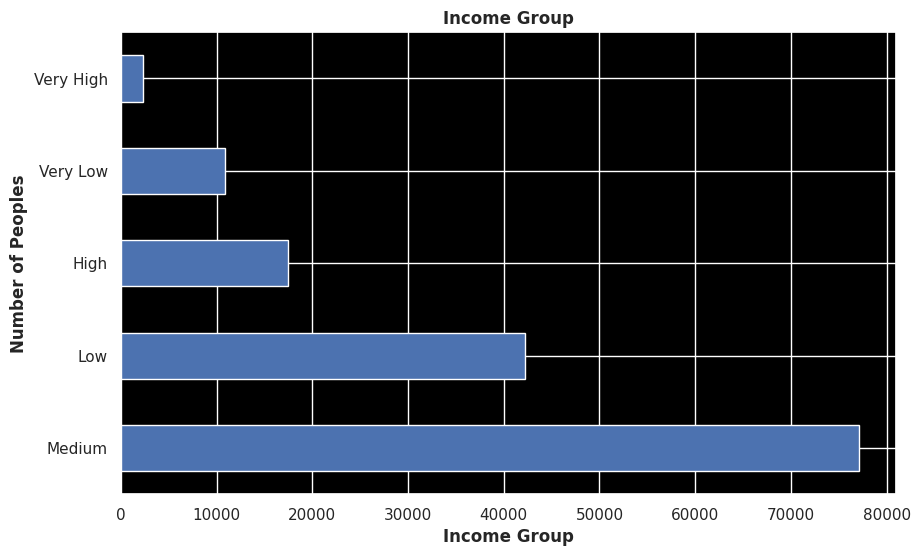

In [154]:
import seaborn as sns
#set style of plot
sns.set(rc={'axes.facecolor':'#000000', 'figure.facecolor':(0,0,0,0)})
income.plot(kind='barh')

#set the title of graph
plt.title("Income Group",fontweight='bold')

#set the label names
plt.xlabel("Income Group",fontweight='bold')
plt.ylabel("Number of Peoples",fontweight='bold')
plt.show();

In above visualization we can observe that there are only people in the category of very high income.

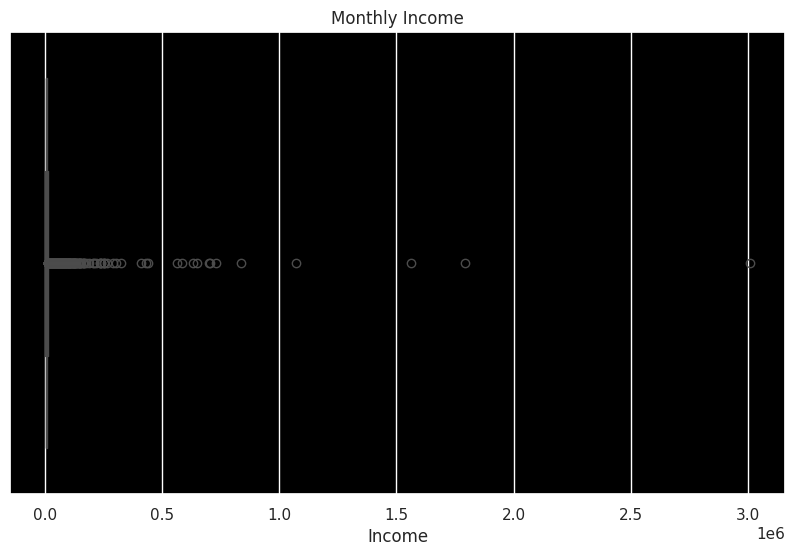

In [155]:
#ploting the graph
sns.boxplot(x=raw_df['MonthlyIncome'])

#set the title of grpah
plt.title("Monthly Income")

#set the label name
plt.xlabel("Income")
plt.show()

In the above visualization, In the column of MonthlyIncome , there are many outlier which will affect our model.

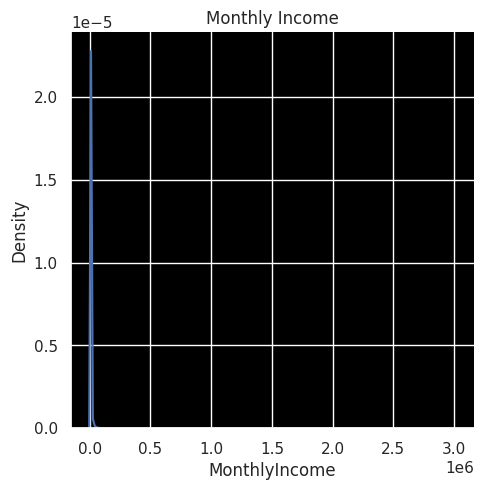

In [156]:
#ploting the displot
sns.displot(x=raw_df['MonthlyIncome'],kind='kde')

#ploting the title name
plt.title("Monthly Income")
plt.show()

In [159]:
raw_df.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.500000e+05,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.418455e+03,8.452760,0.265973,1.018240,0.240387,0.737413
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.289040e+04,5.145951,4.169304,1.129771,4.155179,1.107021
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.903000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,7.400000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000


In [160]:
#checking the skewness of the Monthly income column.
raw_df['MonthlyIncome'].skew()

127.12169564549764

Our dataset is extremely high skewed which will effect our model

In [161]:
#checking the statistics of monthlyincome column
raw_df['MonthlyIncome'].describe()

count    1.500000e+05
mean     6.418455e+03
std      1.289040e+04
min      0.000000e+00
25%      3.903000e+03
50%      5.400000e+03
75%      7.400000e+03
max      3.008750e+06
Name: MonthlyIncome, dtype: float64

In [162]:
#checking the values at 1 and 99 Percentile in Monthly Column
lower_limit = raw_df['MonthlyIncome'].quantile(0.01)
upper_limit= raw_df['MonthlyIncome'].quantile(0.99)

#Printing the percentiles
print(lower_limit)
print(upper_limit)

0.0
23000.0


We can see that the value at 0 percentile is 0 and the value at 99 percentile is 23000. But according to the MonthlyIncome stats the maximum value is 3M+. That's means the mostly outliers are belong to the 100th percentile.

In [163]:
# changing the dataset' MonthlyIncome values.
#taking the value which are belongs between lower limit and upper limit
raw_df = raw_df[(raw_df['MonthlyIncome'] <= 23000) & (raw_df['MonthlyIncome'] >= 0)]

In [164]:
raw_df['MonthlyIncome'].describe()

count    148501.000000
mean       5972.281648
std        3458.818240
min           0.000000
25%        3885.000000
50%        5400.000000
75%        7231.000000
max       23000.000000
Name: MonthlyIncome, dtype: float64

In [165]:
#checking the shape of dataset
raw_df.shape

(148501, 12)

In [166]:
#Again checking the skewness of the column
raw_df['MonthlyIncome'].skew()

1.3832330165464042

Now, skewness is reduced from 127.128 to 1.38.

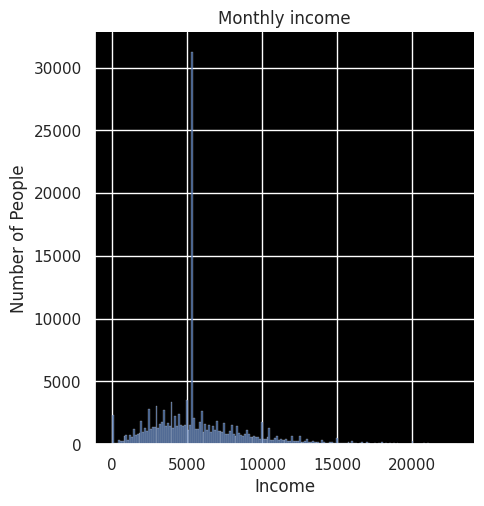

In [167]:
#ploting the displot
sns.displot(x=raw_df['MonthlyIncome'])

#set the title
plt.title("Monthly income")

#set the labels
plt.xlabel("Income")
plt.ylabel("Number of People")
plt.show();

Now, let's check the skewness of the other columns.

In [168]:
#checking the skewness of columns
raw_df[['NumberOfTime30-59DaysPastDueNotWorse', 'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse','DebtRatio']].skew()

NumberOfTime30-59DaysPastDueNotWorse    22.531721
NumberOfTimes90DaysLate                 23.014288
NumberRealEstateLoansOrLines             3.061774
NumberOfTime60-89DaysPastDueNotWorse    23.258604
DebtRatio                               94.718961
dtype: float64

In [169]:
#changing values into log value
log_col = ['NumberOfTime30-59DaysPastDueNotWorse','NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse','DebtRatio']
for col in log_col:
  raw_df[col] = np.log1p(raw_df[col])

In [170]:
#checking the skewness of columns
raw_df[['NumberOfTime30-59DaysPastDueNotWorse','NumberOfDependents','NumberOfOpenCreditLinesAndLoans','NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse','DebtRatio']].skew()

NumberOfTime30-59DaysPastDueNotWorse     4.281295
NumberOfDependents                       1.635585
NumberOfOpenCreditLinesAndLoans         -0.735527
NumberOfTimes90DaysLate                  8.792990
NumberRealEstateLoansOrLines             0.227106
NumberOfTime60-89DaysPastDueNotWorse    10.593713
DebtRatio                                1.733252
dtype: float64

Let's check them one by one.

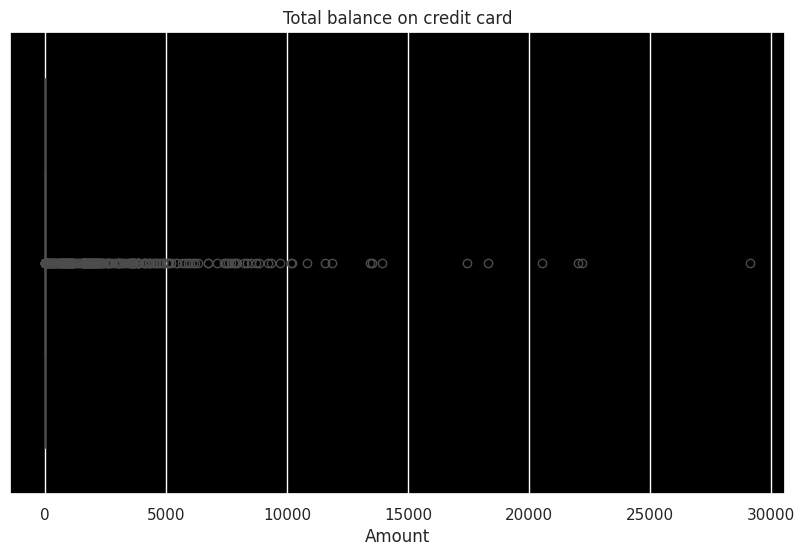

In [171]:
#ploting the boxplot
sns.boxplot(x=raw_df['RevolvingUtilizationOfUnsecuredLines'])

#set the title
plt.title("Total balance on credit card")

#set the labels
plt.xlabel("Amount")
plt.show()

In the column of RevolvingUtilizationOfUnsecuredLines, there are many outlier which will effect our model

In [172]:
#checking the skewness of the column
raw_df['RevolvingUtilizationOfUnsecuredLines'].skew()

68.98555533069562

Skewness of RevovingUtilizationOfUnsecuredLines column is 68.9855 which is extremely high skewness

In [173]:
#checking the quantile of RevolvingUtilizationOfUnsecuredLines column

low_limit = raw_df['RevolvingUtilizationOfUnsecuredLines'].quantile(0.005)
high_limit = raw_df['RevolvingUtilizationOfUnsecuredLines'].quantile(0.995)

In [174]:
#checking the low limit and high limit
print(low_limit)
print(high_limit)

0.0
1.3619338205


In [175]:
#changing the data in raw_df. and store the data between low limit and high limit
raw_df = raw_df[(raw_df['RevolvingUtilizationOfUnsecuredLines'] <= 1.361) & (raw_df['RevolvingUtilizationOfUnsecuredLines'] >=0)]

In [176]:
#checking the shape of dataset
raw_df.shape

(147757, 12)

In [177]:
#checking the skewness of data
raw_df['RevolvingUtilizationOfUnsecuredLines'].skew()

0.9244294670879698

Now,skewness of the  RevolvingUtilizationOfUnsecuredLines column is 0.9244 from 68.98.

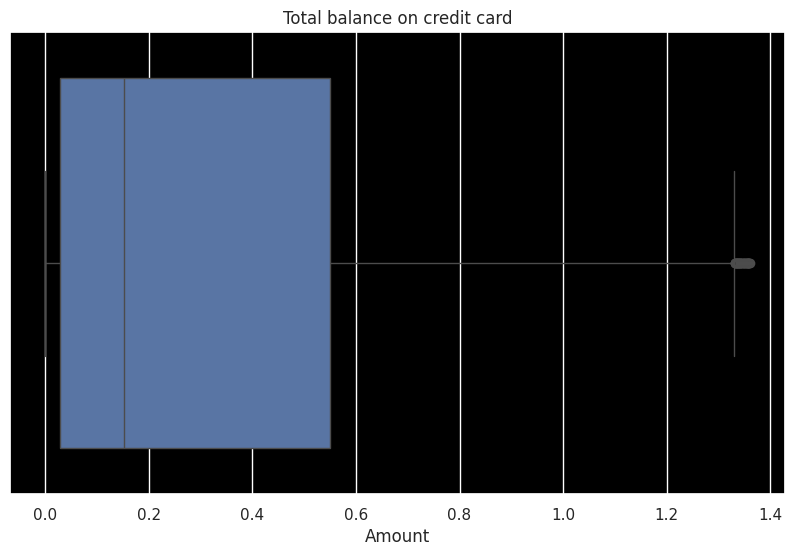

In [178]:
sns.boxplot(x=raw_df['RevolvingUtilizationOfUnsecuredLines'])

#set the title
plt.title("Total balance on credit card")
plt.xlabel("Amount")
plt.show()

Now ,Let's look at the skewness of the **`NumberOfOpenCreditLinesAndLoans`** column

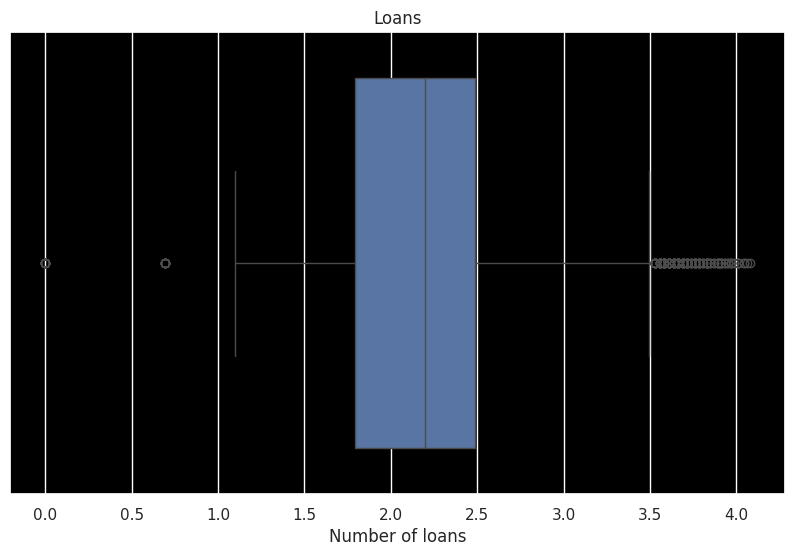

In [179]:
#ploting the boxplot after transformation
sns.boxplot(x=raw_df['NumberOfOpenCreditLinesAndLoans'])

#set the title
plt.title("Loans")

#set the labels
plt.xlabel("Number of loans")
plt.show();

After transforming the column data into sqrt, we are getting good skewness.

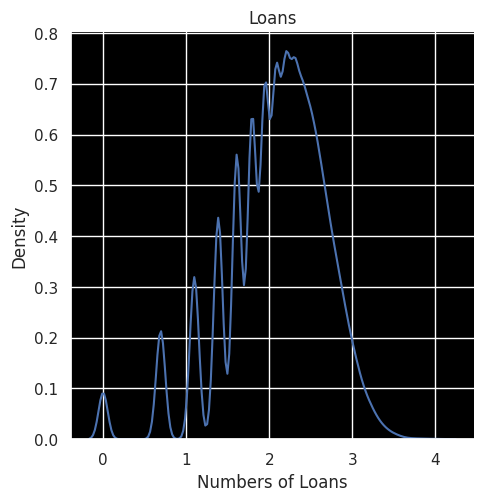

In [180]:
#ploting the displot
sns.displot(x=raw_df['NumberOfOpenCreditLinesAndLoans'],kind='kde')

#set the title
plt.title("Loans")

#set the labels
plt.xlabel("Numbers of Loans")
plt.show()

Now, let's look at the **`NumberOfDependents`** column.

In [181]:
raw_df = raw_df[raw_df['NumberOfDependents']<6]

In [182]:
#checking the skewness
raw_df['NumberOfDependents'].skew()

1.465544110488245

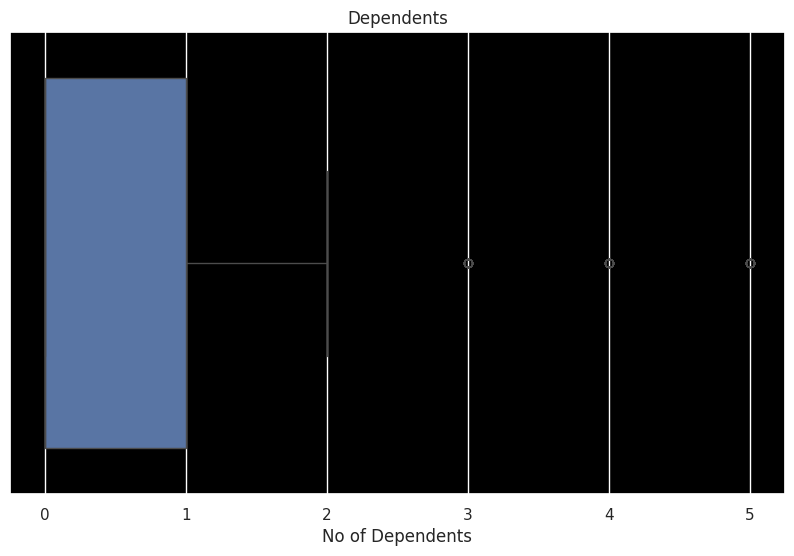

In [183]:
#ploting the boxplot of number of dependents colum
sns.boxplot(x=raw_df['NumberOfDependents'])

#set the title
plt.title("Dependents")

#set the labels
plt.xlabel("No of Dependents")
plt.show();

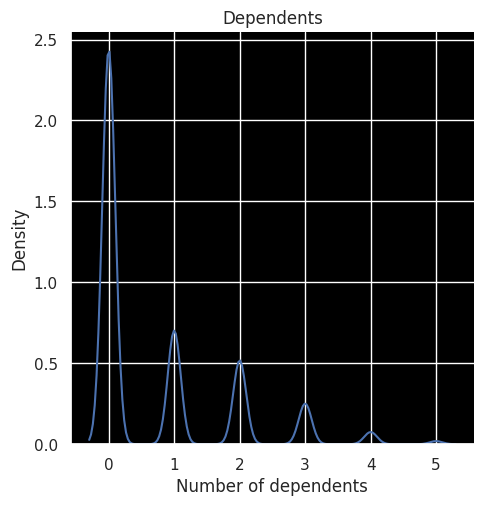

In [184]:
#ploting the displot of number of dependents column
sns.displot(x=raw_df['NumberOfDependents'],kind='kde')

#set the title
plt.title("Dependents")

#set the labels
plt.xlabel("Number of dependents")
plt.show()

In [185]:
#checking the skewness of data
raw_df['NumberOfDependents'].skew()

1.465544110488245

Now, let's look at the Debt Ratio column.

In [186]:
#checking the skewness
raw_df['DebtRatio'].skew()

1.7334869606056573

In [187]:
#checking the quantile of RevolvingUtilizationOfUnsecuredLines column

low_limit = raw_df['DebtRatio'].quantile(0.025)
high_limit = raw_df['DebtRatio'].quantile(0.975)

In [188]:
#checking the low limit and high limit
print(low_limit)
print(high_limit)

0.0
8.162801353492073


In [189]:
#changing the data in raw_df. and store the data between low limit and high limit
raw_df = raw_df[(raw_df['DebtRatio'] <= 3490) & (raw_df['DebtRatio'] >=0)]

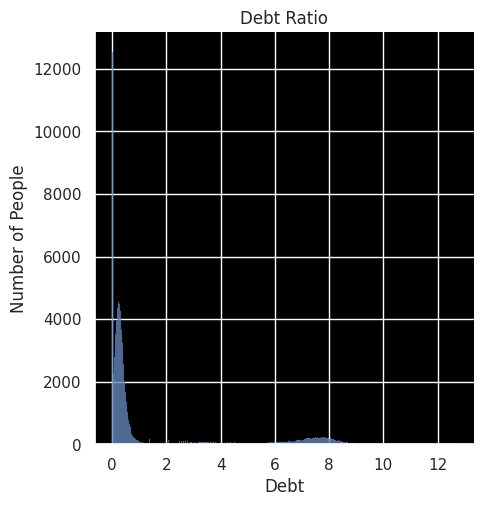

In [190]:
#ploting the displot of Debt ratio
sns.displot(raw_df['DebtRatio'])

#set the title
plt.title("Debt Ratio")

#set the labels
plt.xlabel("Debt")
plt.ylabel("Number of People")
plt.show()

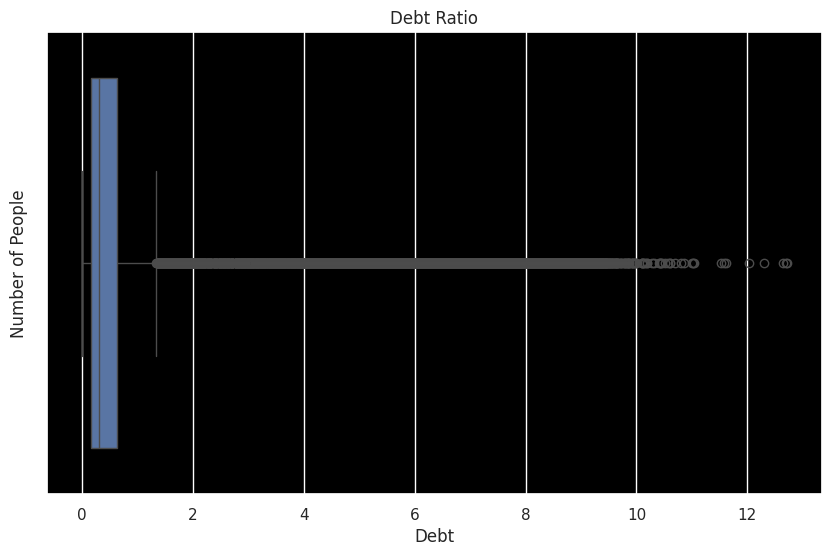

In [191]:
#ploting the box plot
sns.boxplot(x=raw_df['DebtRatio'])

#set the title
plt.title("Debt Ratio")

#set the labels
plt.xlabel("Debt")
plt.ylabel("Number of People")
plt.show();

In the above visualization we can see that there are many outlier in the Debt Ratio column

# **`Exploratory Data Analysis (EDA)`**

In [192]:
#import the seaborn library
import seaborn as sns
#set the color of grid
#set the font size and font color
#set the figure size
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

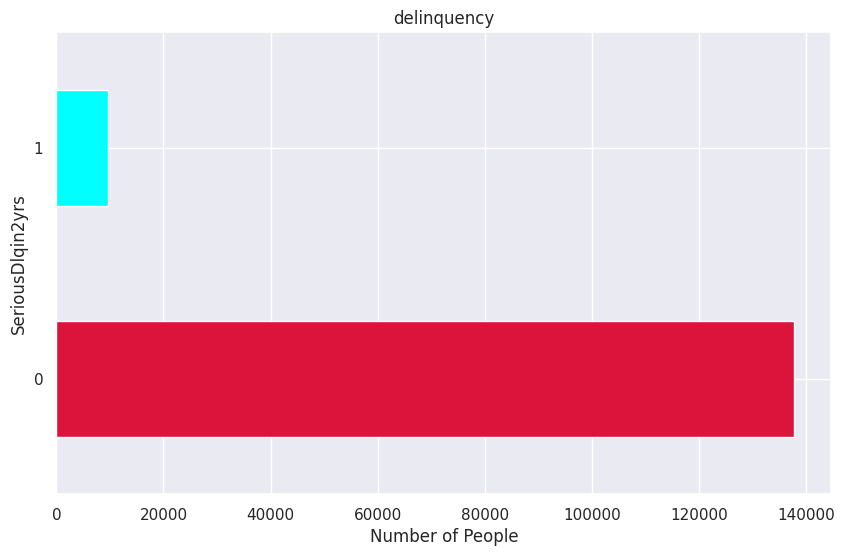

In [193]:
#saving the value count of seriousDlqin into a variable
new = raw_df['SeriousDlqin2yrs'].value_counts()
#ploting a bar graph
new.plot(kind='barh',color=['#DC143C','#00FFFF'])

plt.title("delinquency")
plt.xlabel("Number of People");

The observation that the only approx. 1000 people experienced 90 days past due delinquency or worse might be because the finacial problam, health issue or any other personal problam. And might be becasue There are always 1% people who are not honest.

In [194]:
#droping the raws where Total balance on credit cards is greater than 10k
raw_df=raw_df[raw_df['RevolvingUtilizationOfUnsecuredLines']<10000]

In [195]:
#ploting a histogram to show Total balance on credit cards
fig = px.histogram(raw_df,
                   x='RevolvingUtilizationOfUnsecuredLines',
                   marginal='box',
                   nbins=20,
                   #set the title of graph
                   title="Total balance on credit cards"
                   )
fig.update_layout(#set the axis labels
                  xaxis_title="Total Balance",
                  yaxis_title="Number of People",
                  width=800,
                  height=600,
                  plot_bgcolor = 'rgb(0,0,0)',
                  paper_bgcolor = 'rgb(10,10,10)',
                  #set the font size and color
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF'
                  )
)

fig.show();

The observation that the mostly people have only approx. 0-1.5 Total balance on credit cards and personal lines of credit except.But there are few people who have high number of credit balance as compared to these people.

In [196]:
#ploting a histogram to show AGE distribution
fig = px.histogram(raw_df,
                   x='age',
                   marginal='box',
                   title="Distribution of Age")

#update the layout
fig.update_layout(#set the gap between the bars
                  bargap=0.1,
                  #set the axis labels
                  xaxis_title="Age",
                  yaxis_title="Number of People",
                  width=800,
                  height=600,
                  #set the background color of histogram
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #set the font size and
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF')
                  )
fig.show()

the observed that the mostly people who borrow the money are aged between 49-50. There are no borrower aged less than 21 might be because in some country the age limit to get loan is above 20.And In many countries the age limit is 18. The number of borrower incresed with age till the 50. After the 50, the number of borrower decrease might be because banks don't like to give loan to old age person.

In [197]:
#ploting the histogram to show Number of Times Borrower has been past due
fig = px.histogram(raw_df,
                   x='NumberOfTime30-59DaysPastDueNotWorse',
                   title="Number of Times Borrower has been past due"
)


#updating the layout of graph
fig.update_layout(bargap=0.1,
                  #set the axis labels
                  xaxis_title="Number of Due",
                  yaxis_title="Number of Times",
                  width=800,
                  height=600,
                  #set the background color of histogram
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #set the font size and
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF')
                  )
fig.show();

The observed that the mostly people had not due their payment more than 30-59 days.But their are few people who deley their due payment 2-3 times.


In [198]:
fig = px.histogram(raw_df,
                   x='DebtRatio',
                   marginal='box',
                   nbins=10,
                   title="Debt Ratio"
                   )

#updating the layout of graph
fig.update_layout(bargap=0.1,
                  #set the axis labels
                  xaxis_title="Debt Ratio",
                  yaxis_title="Number of Peoples",
                  width=800,
                  height=600,
                  #set the background color of histogram
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #set the font size and
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF')
                  )

fig.show()

Debt Ratio is Monthly debt payments, alimony,living costs divided by monthy gross income.
From above graph , we observed that the mostly people have debt ratio is between 0-1K. But their are many very people who have high debt ratio.

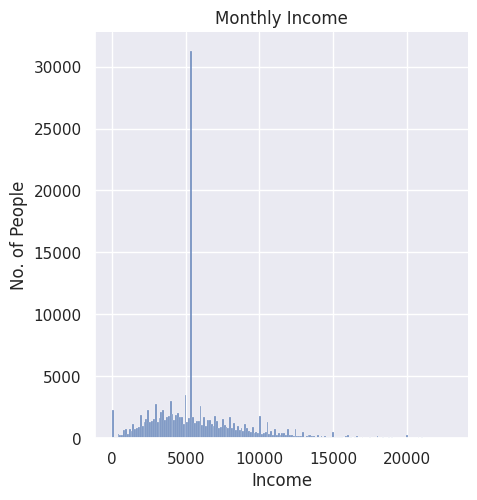

In [199]:
#ploting a box plot
sns.displot(raw_df['MonthlyIncome'])

#updating the layout of graph
plt.title("Monthly Income")
plt.xlabel("Income"),
plt.ylabel("No. of People")
sns.set(rc={'axes.facecolor':'#000000', 'figure.facecolor':(0,0,0,0)})

From the above graph, we observe that their are some people who have nearly 0 monthly income. And mostly people have monthly income between 1K-5000. And very few people who have monthly income greater than 10000. The reason of zero monthly income or low monthly income might be unemployment and that's why these people are borrowing money.

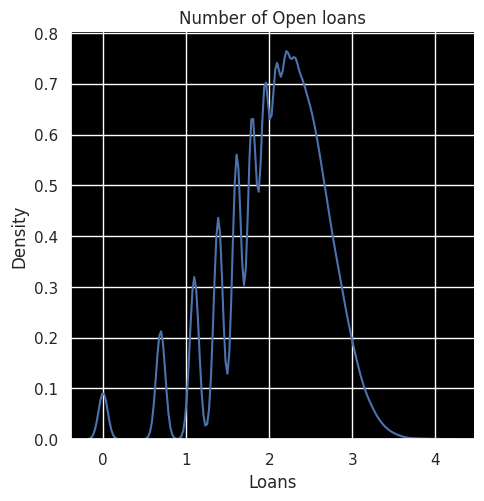

In [200]:
#ploting displot to show Number of Open Loans
sns.displot(raw_df['NumberOfOpenCreditLinesAndLoans'],kind='kde')


#set axis label
plt.title("Number of Open loans")
plt.xlabel("Loans")
#updating the layout of graph
sns.set(rc={'axes.facecolor':'#000000', 'figure.facecolor':(0,0,0,0)});

In [201]:
#ploting the scatterplot to show Relation between Age and credit balance
fig=px.scatter(raw_df,
               y='RevolvingUtilizationOfUnsecuredLines',
               x='age',
               color='SeriousDlqin2yrs',
               opacity=0.8,
               title="Age VS Credit Balance",
               )

#updating the graph layout
fig.update_layout(#set axis label
                  xaxis_title="Age",
                  yaxis_title="Credit Balance",
                  #graph background color
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #font color and size
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF')

                  )
fig.show()

From the above graph, we observed that the credit balance is nearly zero from age 20 to 100year age.but there are few people who have high credit balance and they are aged between 25-80.

In [202]:
#ploting the scatterplot to show relationship between Debt ratio and Monthly income
fig= px.scatter(raw_df,
                x='DebtRatio',
                y='MonthlyIncome',
                color ='SeriousDlqin2yrs',
                title="Debt Ratio Vs Monthly Income")

#updating the graph layout
fig.update_layout(#set axis label
                  xaxis_title="Debt Ratio",
                  yaxis_title="Monthly Income",
                  #graph background color
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #font color and size
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF')
)


fig.show()

From the above graph, we observed that people who have zero or nearly zero monthly income have high Debt ratio. and People who have monthly income greater than 1000 have zero debt ratio. The reason might be because the people who have any earning source they clear their credit balance but the people who have no source of income are unable to clear their credit balance

In [203]:
#ploting the scatterplot to show relationship between Monthly income and Age
fig = px.scatter(raw_df,
                  y='MonthlyIncome',
                  x='age',
                  color='SeriousDlqin2yrs',
                  facet_col='SeriousDlqin2yrs',
                  opacity=0.8,
                  title="Monthly Income VS Age VS delinquency")

#updating the graph layout
fig.update_layout(#set axis label
                  xaxis_title="Age",
                  yaxis_title="Credit Balance",
                  #graph background color
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #font color and size
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF'))
fig.show()

/usr/local/lib/python3.10/dist-packages/plotly/express/_core.py:1992: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



From the above graph, we observed that the people who experienced 90 days past due delinquency or worse have low credit balance as compared to other people.

In [204]:
dependent = raw_df['NumberOfDependents'].value_counts()
dependent

NumberOfDependents
0.0    89809
1.0    25872
2.0    19097
3.0     9258
4.0     2771
5.0      711
Name: count, dtype: int64

In [205]:
#saving the value count of number of dependents into a variable
dependent = raw_df['NumberOfDependents'].value_counts()
#setting the index and rename the index
dependent_index = dependent.reset_index().rename(columns={"NumberOfDependents":"members","index":"counts"})
dependent_index


,members,count
0,0.0,89809
1,1.0,25872
2,2.0,19097
3,3.0,9258
4,4.0,2771
5,5.0,711


In [206]:
#ploting a bar graph to show the Number of people dependents on Borrower
fig = px.bar(dependent_index,
             x='members',
             y='count',
             title="Number of People Dependents")


#updating the graph layout
fig.update_layout(#set axis label
                  xaxis_title="Members",
                  yaxis_title="Number of People",
                  #graph background color
                  plot_bgcolor='rgb(17,17,17)',
                  paper_bgcolor ='rgb(10,10,10)',
                  #font color and size
                  font=dict(
                      family='Ariel',
                      size=14,
                      color='#F0FFFF'))
fig.show()

From the above visualization, we observed that the mostly people have zero dependents who borrow money.Number of dependents in family excluding themselves (spouse, children etc.). There are some people who have one or more dependents might be they are their spouse, children or parents.

# **Translating Business Problem to Machine Learning**
Target variable: Predict “SeriousDlqin2yrs” in the future using current information. Our target variable "SeriousDlqin2yrs”, is a classification values.Our target variable "SeriousDlqin2yrs" refer to the meaning of Person experienced 90 days past due delinquency or worse

Input variables : We can categorise the variables as below

Inputs : 'RevolvingUtilizationOfUnsecuredLines', 'age', 'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents'.

Model:
This problem can be modeled using a single classical supervised machine learning classification .

We will use a classification model to predict our target variable which is a classification Variable.

We will explore the following categories of models, engineer features and hypertune parameters to choose a model with the best fit.

* logistic Regression model
* Decision Tree model
* Random Forest model

Evaluation criteria. Accuracy score.

# **Split Training & Validation Set**
we'll set aside 80% of the data as training data & 20% of the data as the validation set.

#### **Spliting the Dataset**

In [207]:
#installing the scikit learn library
!pip install scikit-learn --upgrade --quiet

In [208]:
#importing the library
from sklearn.model_selection import train_test_split

In [209]:
#spliting the dataset into 80-20 ratio. 80% dataset is for training and 20% dataset is for validation
train_df, val_df = train_test_split(raw_df, test_size=0.3, random_state=42)

#### **Data set Sizes**

In [210]:
#checking the dataset size
print("train_df.shape :",train_df.shape)
print("val_df.shape :",val_df.shape)
print("test_df.shape :",test_df.shape)

train_df.shape : (103262, 12)
val_df.shape : (44256, 12)
test_df.shape : (101503, 12)


In [211]:
#checking the data of train dataset
train_df[:5]

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,Income_group
114018,0,0.060460,53,0.0,0.362259,8000.0,1.945910,0.000000,0.693147,0.000000,1.0,Medium
52184,0,0.000000,52,0.0,0.184954,11000.0,2.564949,0.000000,1.098612,0.000000,2.0,High
87284,0,1.000000,51,0.0,6.765039,5400.0,1.609438,1.098612,0.693147,0.693147,0.0,Medium
131701,0,0.734979,59,0.0,8.386857,5400.0,2.639057,0.000000,0.693147,0.000000,0.0,Medium
34779,0,0.026228,50,0.0,9.394244,0.0,2.833213,0.000000,1.386294,0.000000,0.0,Very Low


In [212]:
#checking the data of validation dataset
val_df[:5]

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,Income_group
17791,1,0.458887,47,1.609438,0.457013,5500.0,2.890372,0.0,0.693147,0.0,0.0,Medium
61256,0,1.000000,21,0.000000,0.000000,1921.0,1.098612,0.0,0.000000,0.0,0.0,Very Low
92674,1,1.000000,49,0.693147,0.204621,2342.0,0.693147,0.0,0.000000,0.0,0.0,Low
107294,0,0.103199,47,0.693147,0.219025,9780.0,2.484907,0.0,1.098612,0.0,1.0,Medium
149185,0,0.274597,52,0.000000,0.267008,13219.0,2.079442,0.0,1.098612,0.0,3.0,High


### **Extract Inputs & Outputs Features**

In [213]:
#extracting the input columns and output columns from dataset
input_cols = list(train_df.columns)[1:]
target_cols = 'SeriousDlqin2yrs'

In [214]:
#checking the input columns
print(input_cols)

['RevolvingUtilizationOfUnsecuredLines', 'age', 'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome', 'NumberOfOpenCreditLinesAndLoans', 'NumberOfTimes90DaysLate', 'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse', 'NumberOfDependents', 'Income_group']


In [215]:
#checking the target columns
print(target_cols)

SeriousDlqin2yrs


In [216]:
#creating two different variable of training dataset.
#one is input columns's dataset and another is target column dataset
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_cols].copy()

In [217]:
#creating two different variable of validation dataset.
val_inputs=val_df[input_cols].copy()
val_targets = val_df[target_cols].copy()

In [218]:
#checking the shape of test dataset
test_df.shape

(101503, 12)

In [219]:
#creating two different variable of test dataset.
test_inputs= test_df[input_cols].copy()
test_targets = test_df[target_cols].copy()

In [220]:
#printing the shape of all datasets

print('Train_Input.Shape',train_inputs.shape)
print('Train_targets.Shape',train_targets.shape)
print('val_Input.Shape',val_inputs.shape)
print('val_targets.Shape',val_targets.shape)
print('Test_Input.Shape',test_inputs.shape)
print('Test_targets.Shape',test_targets.shape)

Train_Input.Shape (103262, 11)
Train_targets.Shape (103262,)
val_Input.Shape (44256, 11)
val_targets.Shape (44256,)
Test_Input.Shape (101503, 11)
Test_targets.Shape (101503,)


In [221]:
#printing the input datasets
train_inputs[:5]

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,Income_group
114018,0.060460,53,0.0,0.362259,8000.0,1.945910,0.000000,0.693147,0.000000,1.0,Medium
52184,0.000000,52,0.0,0.184954,11000.0,2.564949,0.000000,1.098612,0.000000,2.0,High
87284,1.000000,51,0.0,6.765039,5400.0,1.609438,1.098612,0.693147,0.693147,0.0,Medium
131701,0.734979,59,0.0,8.386857,5400.0,2.639057,0.000000,0.693147,0.000000,0.0,Medium
34779,0.026228,50,0.0,9.394244,0.0,2.833213,0.000000,1.386294,0.000000,0.0,Very Low


In [222]:
#printing the target datasets
train_targets[:5]

114018    0
52184     0
87284     0
131701    0
34779     0
Name: SeriousDlqin2yrs, dtype: int64

In [223]:
#checking info of train dataset
train_inputs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103262 entries, 114018 to 124006
Data columns (total 11 columns):
 #   Column                                Non-Null Count   Dtype   
---  ------                                --------------   -----   
 0   RevolvingUtilizationOfUnsecuredLines  103262 non-null  float64 
 1   age                                   103262 non-null  int64   
 2   NumberOfTime30-59DaysPastDueNotWorse  103262 non-null  float64 
 3   DebtRatio                             103262 non-null  float64 
 4   MonthlyIncome                         103262 non-null  float64 
 5   NumberOfOpenCreditLinesAndLoans       103262 non-null  float64 
 6   NumberOfTimes90DaysLate               103262 non-null  float64 
 7   NumberRealEstateLoansOrLines          103262 non-null  float64 
 8   NumberOfTime60-89DaysPastDueNotWorse  103262 non-null  float64 
 9   NumberOfDependents                    103262 non-null  float64 
 10  Income_group                          103262 non-null  c

### **Scaling & Encoding**
Scaling Numerical & categorical Feature

In [224]:
#checking the type of dataset
numerical_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
cate_cols = train_inputs.select_dtypes('category').columns.tolist()

In [225]:
#checking numerical columns
train_inputs[numerical_cols].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000
mean,0.317351,52.311286,0.146134,1.539552,5977.973717,2.086630,0.055059,0.572079,0.046582,0.721689
std,0.350366,14.818526,0.389103,2.638675,3464.849084,0.597716,0.286042,0.497387,0.260757,1.076268
min,0.000000,21.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.029572,41.000000,0.000000,0.163921,3890.250000,1.791759,0.000000,0.000000,0.000000,0.000000
50%,0.151849,52.000000,0.000000,0.315130,5400.000000,2.197225,0.000000,0.693147,0.000000,0.000000
75%,0.550687,63.000000,0.000000,0.633340,7233.000000,2.484907,0.000000,1.098612,0.000000,1.000000
max,1.360426,107.000000,4.595120,12.705832,23000.000000,4.077537,4.595120,4.007333,4.595120,5.000000


In [226]:
#checking categorical columns
raw_df[cate_cols]

,Income_group
0,Medium
1,Low
2,Low
3,Low
5,Low
...,...
149995,Low
149996,Medium
149997,Medium
149998,Medium


In the input dataset, there are one categorical columns

In [227]:
#checking the null value in numerical datatype
raw_df[numerical_cols].isna().sum()

RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfTime60-89DaysPastDueNotWorse    0
NumberOfDependents                      0
dtype: int64

### **Encoding the Dataset**

In [228]:
#importing the MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

In [229]:
#passing the MinMaxScaler in a variable
scaler = MinMaxScaler()

In [230]:
scaler.fit(raw_df[numerical_cols])

MinMaxScaler()

In [231]:
print('minimum')
list(scaler.data_min_)

minimum


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [232]:
print('mixmum')
list(scaler.data_max_)

mixmum


[1.360426382,
 109.0,
 4.59511985013459,
 12.70583226631223,
 23000.0,
 4.07753744390572,
 4.59511985013459,
 4.007333185232471,
 4.59511985013459,
 5.0]

In [233]:
#transforming the all datasets in MinMax
train_inputs[numerical_cols] = scaler.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = scaler.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = scaler.transform(test_inputs[numerical_cols])

In [234]:
#checking the input dataset
train_inputs[numerical_cols].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000,103262.000000
mean,0.233273,0.479920,0.031802,0.121169,0.259912,0.511738,0.011982,0.142758,0.010137,0.144338
std,0.257541,0.135950,0.084677,0.207674,0.150646,0.146588,0.062249,0.124119,0.056746,0.215254
min,0.000000,0.192661,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.021737,0.376147,0.000000,0.012901,0.169141,0.439422,0.000000,0.000000,0.000000,0.000000
50%,0.111618,0.477064,0.000000,0.024802,0.234783,0.538861,0.000000,0.172970,0.000000,0.000000
75%,0.404790,0.577982,0.000000,0.049846,0.314478,0.609414,0.000000,0.274150,0.000000,0.200000
max,1.000000,0.981651,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [235]:
#checking the size of all datasets
print("train_inputs.shape :", train_inputs.shape)
print("train_targets.shape :", train_targets.shape)
print("val_inputs.shape :", val_inputs.shape)
print("val_targets.shape :", val_targets.shape)
print("test_inputs.shape :", test_inputs.shape)
print("test_targets.shape :", test_targets.shape)

train_inputs.shape : (103262, 11)
train_targets.shape : (103262,)
val_inputs.shape : (44256, 11)
val_targets.shape : (44256,)
test_inputs.shape : (101503, 11)
test_targets.shape : (101503,)


### **OneHotEncoding**

In [236]:
#importing the library
from sklearn.preprocessing import OneHotEncoder
from scipy.sparse import hstack

In [237]:
#fiting the onehotencoding into dataset
encoder = OneHotEncoder(handle_unknown='ignore').fit(train_inputs[cate_cols])

encoded_cols = list(encoder.get_feature_names_out(cate_cols))

# Transform and convert to dense array
transformed_train = encoder.transform(train_inputs[cate_cols]).toarray()
transformed_val = encoder.transform(val_inputs[cate_cols]).toarray()
transformed_test = encoder.transform(test_inputs[cate_cols]).toarray()

# Assign the transformed data back to the DataFrame
train_inputs[encoded_cols] = transformed_train
val_inputs[encoded_cols] = transformed_val
test_inputs[encoded_cols] = transformed_test

In [238]:
train_inputs

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,Income_group,Income_group_High,Income_group_Low,Income_group_Medium,Income_group_Very High,Income_group_Very Low
114018,0.044442,0.486239,0.000000,0.028511,0.347826,0.477227,0.000000,0.172970,0.000000,0.2,Medium,0.0,0.0,1.0,0.0,0.0
52184,0.000000,0.477064,0.000000,0.014557,0.478261,0.629044,0.000000,0.274150,0.000000,0.4,High,1.0,0.0,0.0,0.0,0.0
87284,0.735064,0.467890,0.000000,0.532436,0.234783,0.394708,0.239082,0.172970,0.150844,0.0,Medium,0.0,0.0,1.0,0.0,0.0
131701,0.540256,0.541284,0.000000,0.660079,0.234783,0.647218,0.000000,0.172970,0.000000,0.0,Medium,0.0,0.0,1.0,0.0,0.0
34779,0.019279,0.458716,0.000000,0.739365,0.000000,0.694834,0.000000,0.345939,0.000000,0.0,Very Low,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121882,0.151496,0.596330,0.000000,0.022931,0.354348,0.647218,0.000000,0.345939,0.000000,0.2,Medium,0.0,0.0,1.0,0.0,0.0
105422,0.287304,0.522936,0.000000,0.038448,0.269565,0.768968,0.000000,0.172970,0.150844,0.2,Medium,0.0,0.0,1.0,0.0,0.0
134152,0.035765,0.486239,0.000000,0.015436,0.291304,0.564700,0.000000,0.172970,0.000000,0.4,Medium,0.0,0.0,1.0,0.0,0.0
149337,0.353369,0.348624,0.150844,0.035507,0.402174,0.588074,0.000000,0.401623,0.000000,0.0,Medium,0.0,0.0,1.0,0.0,0.0


In [239]:
#save numerical and categorial columns in new dataset
x_train = train_inputs[numerical_cols + encoded_cols]
x_val = val_inputs[numerical_cols + encoded_cols]
x_test = test_inputs[numerical_cols + encoded_cols]

In [240]:
#printing the train dataset
print(x_train.shape)
print(train_targets.shape)

(103262, 15)
(103262,)


<Axes: >

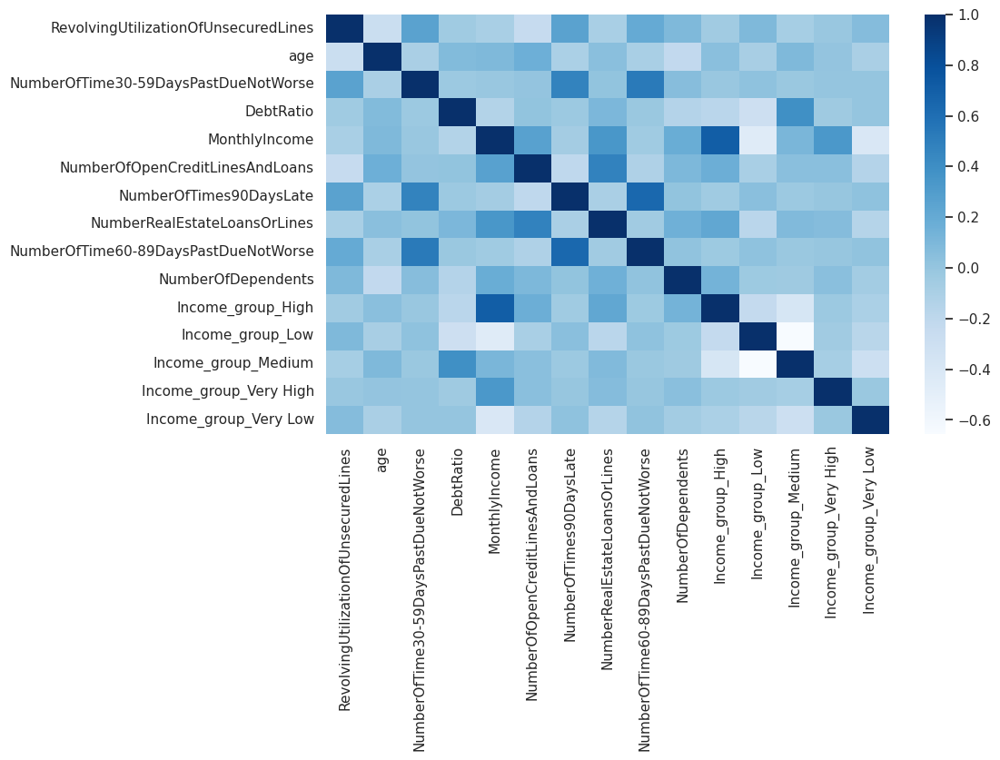

In [241]:
#Now checking the correlation matrix of features in datasets
train_corr = x_train.corr()
sns.heatmap(train_corr, cmap='Blues')

### **Train & Evaluate Hardcoded Model**  

* Hardcoded Model : always predict fare
* Baseline Model : Logistic Regression

Let's create a simple model that always predicts the average

In [242]:
#checking the shape of train target datasett
train_targets.shape

(103262,)

In [243]:
#checking the train input dataset
x_train.shape

(103262, 15)

In [244]:
#importing the LogisticRegrssion library
#importing the accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# **Making the predictions and evaluating the model**

In [345]:
#importing the library
from sklearn.metrics import accuracy_score, confusion_matrix,f1_score, precision_score, recall_score,classification_report
#creating a function to predict the accuracy score
#creating a function which take the inputs and create a model

def predict_model(model,input, target,name='', **params):
  #creating a model by using inputs
  model_ = model(**params).fit(x_train, train_targets)

  #checking the prediction
  pred = model_.predict(input)

  #checking the accuracy_score, Precision, recall and f score of model
  accuracy = accuracy_score(target, pred)
  precision = precision_score(target, pred)
  recall = recall_score(target,pred)
  f1 = f1_score(target, pred)

  #Printing the score

  print(name +' '+ 'Accuracy: {:2f}%'.format(accuracy*100))
  print(name +' '+ 'Precision Score: {:2f}%'.format(precision*100))
  print(name +' '+ 'Recall Score: {:2f}%'.format(recall*100))
  print(name +' '+ 'F1 Score: {:2f}%'.format(f1*100))

  #report = classification_report(target, pred)
  #print("Classification Report:\n", report)


In [246]:
#creating a Logistic model
model = LogisticRegression(solver='liblinear')

In [247]:
#fiting the train dataset in model
model.fit(x_train, train_targets)

LogisticRegression(solver='liblinear')

In [248]:
#creating prediction on train dataset
train_preds = model.predict(x_train)

#checking the prediction
train_preds

array([0, 0, 0, ..., 0, 0, 0])

In [249]:
#checking the probability of prediction
train_prob = model.predict_proba(x_train)
train_prob

array([[0.98294239, 0.01705761],
       [0.98310551, 0.01689449],
       [0.62819924, 0.37180076],
       ...,
       [0.98012038, 0.01987962],
       [0.90385202, 0.09614798],
       [0.9038041 , 0.0961959 ]])

In [250]:
#checking the classes in model
model.classes_

array([0, 1])

In [251]:
#checking the accuracy score
accuracy_score(train_targets, train_preds)

0.9375956305320448

In [252]:
#checking the accuracy score on validation dataset
val_pred = model.predict(x_val)
accuracy= accuracy_score(val_targets, val_pred)
accuracy

0.9384942154736081

In [346]:
#checking accuracy score of train model
predict_model(LogisticRegression, x_train, train_targets,'training', solver='liblinear')

training Accuracy: 93.759563%
training Precision Score: 62.231462%
training Recall Score: 13.211711%
training F1 Score: 21.796117%


In [347]:
#checking accuracy score of train model
predict_model(LogisticRegression, x_val, val_targets,'training', solver='liblinear')

training Accuracy: 93.849422%
training Precision Score: 63.265306%
training Recall Score: 13.939813%
training F1 Score: 22.845805%


In [253]:
#importing the library
from sklearn.metrics import confusion_matrix

#defining a function to plot heatmap
def pred_plot(model, input ,target,name='',**params):
  model_ = model(**params).fit(x_train, train_targets)

  #checking the prediction
  pred = model_.predict(input)

  #checking the accuracy_score of model
  accuracy = accuracy_score(target, pred)
  print(name +' '+ 'Accuracy: {:2f}%'.format(accuracy*100))

  #checking confusion matrix
  cf = confusion_matrix(target, pred, normalize ='true')
  plt.figure()
  #ploting the heatmap
  sns.heatmap(cf, annot=True)

  #set the labels
  plt.xlabel('Prediction')
  plt.ylabel('Target')
  #set the title
  plt.title('Confusion Matrix')


Logistic Accuracy: 93.759563%


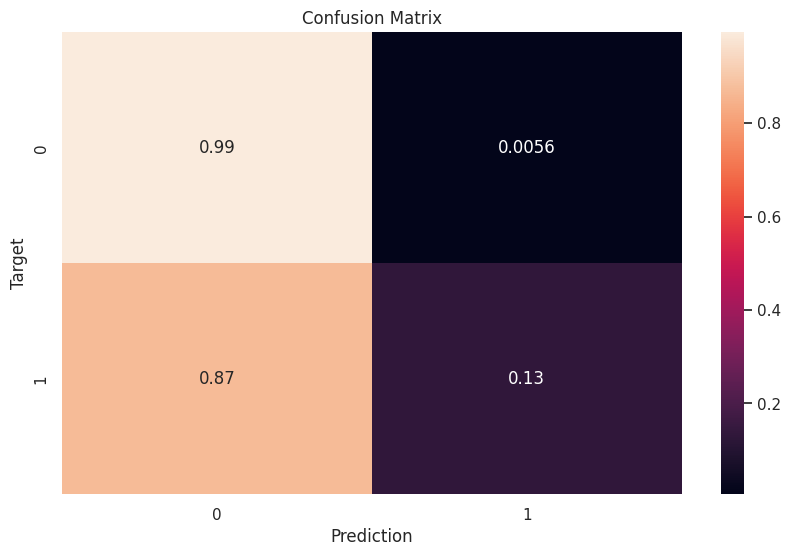

In [254]:
#printing the confusion matrix
pred_plot(LogisticRegression,x_train, train_targets,name='Logistic',solver='liblinear' )

Logistic Validation Accuracy: 93.849422%


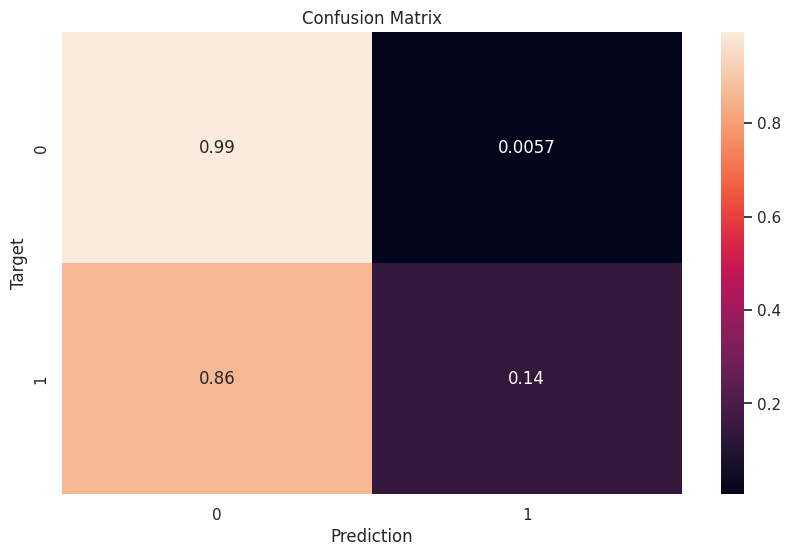

In [256]:
#ploting the confusion matrix of validation dataset
pred_plot(LogisticRegression,x_val, val_targets,name='Logistic Validation',solver='liblinear' )

### **Decision Tree Model**

In [258]:
#importing Decision tree classifier library
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree, export_text

In [259]:
#creating a model
model_2 = DecisionTreeClassifier(random_state=42)

In [260]:
#passing the train dataset
model_2.fit(x_train, train_targets)

DecisionTreeClassifier(random_state=42)

In [261]:
#checking the prediction
train_pred = model_2.predict(x_train)
#checking the accuracy
train_accuracy = accuracy_score(train_targets, train_pred)
train_accuracy*100

99.96320040285875

In [348]:
#checking accuracy score of train model
predict_model(DecisionTreeClassifier, x_train, train_targets,'training', random_state=42)

training Accuracy: 99.963200%
training Precision Score: 99.970427%
training Recall Score: 99.470355%
training F1 Score: 99.719764%


In [349]:
#checking accuracy score of validation model
predict_model(DecisionTreeClassifier, x_val, val_targets,'validation', random_state=42)

validation Accuracy: 89.838666%
validation Precision Score: 24.180064%
validation Recall Score: 26.011761%
validation F1 Score: 25.062490%


validation Accuracy: 89.838666%


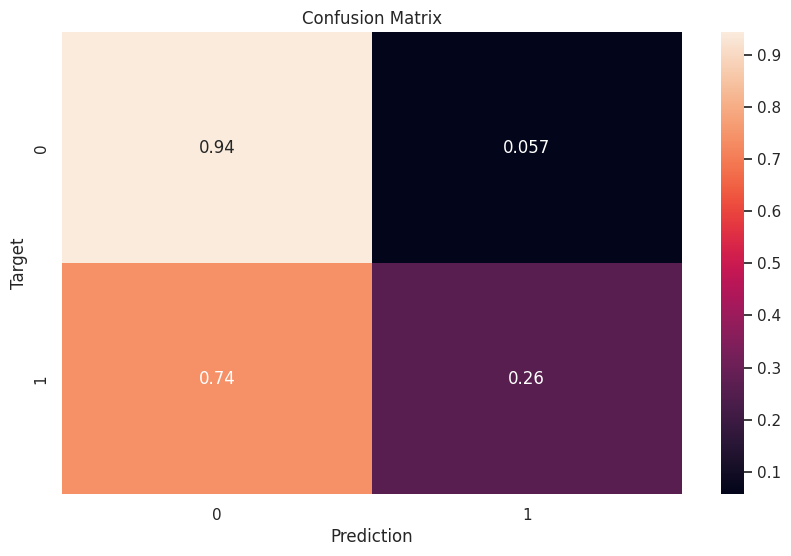

In [264]:
#printing the confusion matrix of validation datasets
pred_plot(DecisionTreeClassifier, x_val, val_targets,'validation', random_state=42 )

In [265]:
#checking the tree depth
model_2.tree_.max_depth

40

In [266]:
#plotling the tree
tree_text = export_text(model_2, max_depth=10, feature_names=list(x_train.columns))
print(tree_text[:2000])

|--- NumberOfTimes90DaysLate <= 0.08
|   |--- RevolvingUtilizationOfUnsecuredLines <= 0.44
|   |   |--- NumberOfTime30-59DaysPastDueNotWorse <= 0.08
|   |   |   |--- NumberOfTime60-89DaysPastDueNotWorse <= 0.08
|   |   |   |   |--- RevolvingUtilizationOfUnsecuredLines <= 0.22
|   |   |   |   |   |--- NumberRealEstateLoansOrLines <= 0.37
|   |   |   |   |   |   |--- age <= 0.54
|   |   |   |   |   |   |   |--- NumberOfOpenCreditLinesAndLoans <= 0.94
|   |   |   |   |   |   |   |   |--- NumberOfOpenCreditLinesAndLoans <= 0.58
|   |   |   |   |   |   |   |   |   |--- age <= 0.33
|   |   |   |   |   |   |   |   |   |   |--- NumberOfDependents <= 0.70
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 18
|   |   |   |   |   |   |   |   |   |   |--- NumberOfDependents >  0.70
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |--- age >  0.33
|   |   |   |   |   |   |   |   |   |   |--- RevolvingUtilization

In [267]:
#importing the pandas library
import pandas as pd

#creating  a function to get importance Features
def importance(input, model):
    #creating a dataframe of features
    importance_df = pd.DataFrame({
        'features': input.columns,
        'importance': model.feature_importances_
    }).sort_values('importance', ascending=False)
    #creting a bar graph of features importance
    plt.title('Features Importance')
    sns.barplot(data=importance_df, x='importance',y='features');
    return importance_df

,features,importance
3,DebtRatio,0.198029
0,RevolvingUtilizationOfUnsecuredLines,0.187477
4,MonthlyIncome,0.143186
6,NumberOfTimes90DaysLate,0.125404
1,age,0.119061
5,NumberOfOpenCreditLinesAndLoans,0.077987
9,NumberOfDependents,0.039305
2,NumberOfTime30-59DaysPastDueNotWorse,0.037364
7,NumberRealEstateLoansOrLines,0.032865
8,NumberOfTime60-89DaysPastDueNotWorse,0.023512


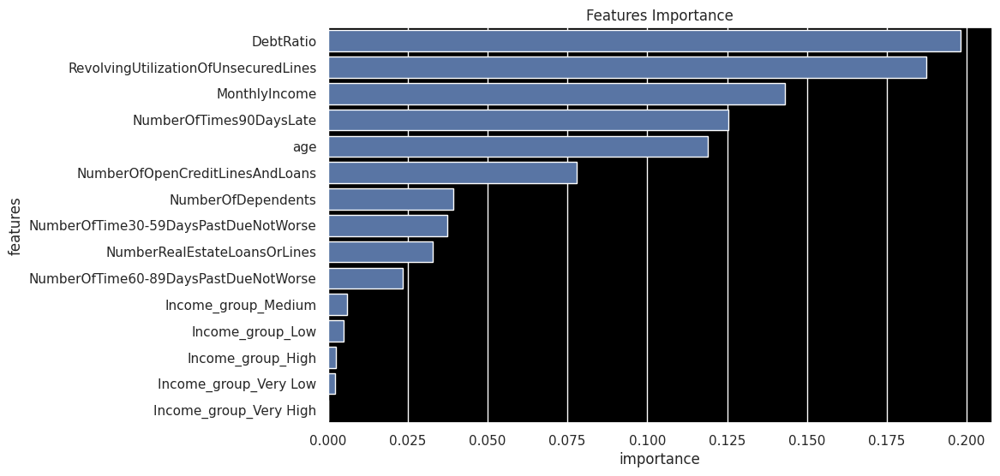

In [268]:
#ploting the feature importance
importance(x_train, model_2)

## **Randome Forest Model**

In [284]:
#importing the RandomForest Classifier
from sklearn.ensemble import RandomForestClassifier

In [285]:
#creating a model
model_3 = RandomForestClassifier(random_state=42)

In [286]:
#fiting the train dataset
model_3.fit(x_train, train_targets)

RandomForestClassifier(random_state=42)

In [287]:
#checking the prediction
train_pred = model_3.predict(x_train)
#checking accuracy
train_accuracy = accuracy_score(train_targets, train_pred)
train_accuracy*100

99.96223199240765

In [350]:
#checking the accuracy score of train dataset
predict_model(RandomForestClassifier,x_train, train_targets,'training', random_state=42)

training Accuracy: 99.962232%
training Precision Score: 99.896633%
training Recall Score: 99.529204%
training F1 Score: 99.712580%


In [351]:
#checking the accuracy score of validation dataset
predict_model(RandomForestClassifier,x_val, val_targets,'validation', random_state=42)

validation Accuracy: 93.648319%
validation Precision Score: 54.310345%
validation Recall Score: 17.433414%
validation F1 Score: 26.394344%


validation Accuracy: 93.648319%


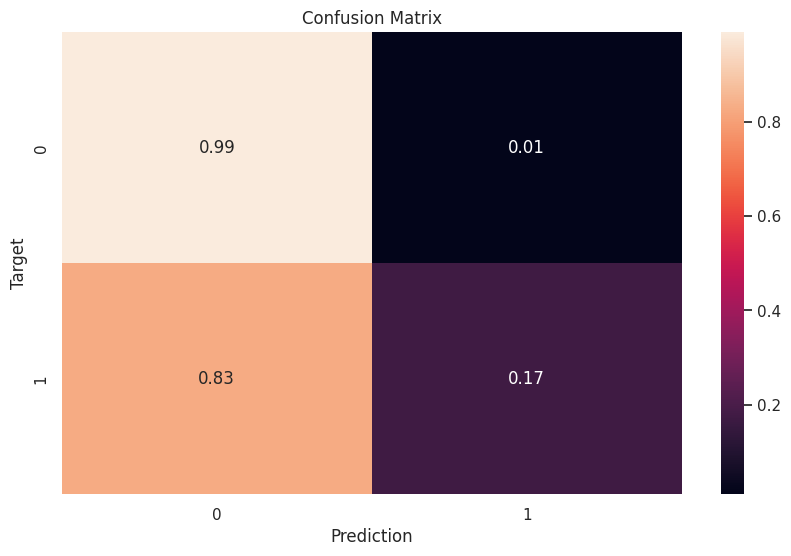

In [290]:
#printing the confusion matrix of validation dataset
pred_plot(RandomForestClassifier,x_val, val_targets,'validation', random_state=42 )

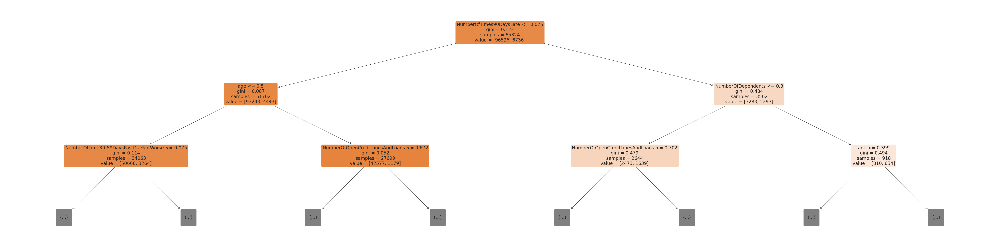

In [291]:
plt.figure(figsize=(80,20))
plot_tree(model_3.estimators_[0], max_depth=2, feature_names=train_inputs.columns, filled=True, rounded=True);

In [294]:
#checking the accuracy score afterr implimenting n_Estimators hypertunning on train dataset
predict_model(RandomForestClassifier,x_train, train_targets,'training', random_state=42,n_jobs=-1,n_estimators=500)

training Accuracy: 99.963200%
training Precision Score: 0.999114%
training Recall Score: 0.995292%
training F1 Score: 0.997199%


In [295]:
#checking the accuracy score afterr implimenting n_Estimators hypertunning on train datasetany
predict_model(RandomForestClassifier,x_val, val_targets,'validation', random_state=42,n_jobs=-1,n_estimators=500)

validation Accuracy: 93.618944%
validation Precision Score: 0.535226%
validation Recall Score: 0.176064%
validation F1 Score: 0.264966%


## **Gradient Boosting**

In [298]:
#installing libraries
!pip install xgboost --upgrade --quiet
!pip install catboost --upgrade --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 2.8 MB/s eta 0:00:00


In [299]:
from sklearn.ensemble import GradientBoostingClassifier

In [300]:
#creating a modek
model = GradientBoostingClassifier()

In [301]:
#fiting the model
model.fit(x_train, train_targets)

GradientBoostingClassifier()

In [302]:
#predicting the value
train_pred = model.predict(x_train)

In [303]:
#checking the accuracy
accuracy = accuracy_score(train_targets,train_pred)
accuracy

0.9398713950920958

In [352]:
#checking accuray, precision on train dataset
predict_model(GradientBoostingClassifier, x_train, train_targets,'Gradient Boosting')

Gradient Boosting Accuracy: 93.987140%
Gradient Boosting Precision Score: 63.031915%
Gradient Boosting Recall Score: 20.920995%
Gradient Boosting F1 Score: 31.415001%


In [353]:
#checking accuracy, precision on validation dataset
predict_model(GradientBoostingClassifier, x_val, val_targets,'Gradient Boosting')

Gradient Boosting Accuracy: 93.849422%
Gradient Boosting Precision Score: 58.720330%
Gradient Boosting Recall Score: 19.681771%
Gradient Boosting F1 Score: 29.481865%


Gradient Boosting Accuracy: 93.847162%


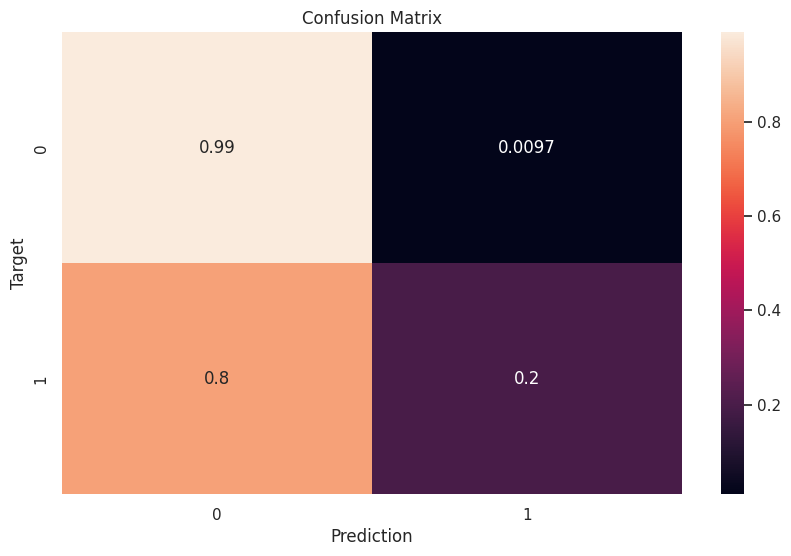

In [306]:
#ploting the heatmap
pred_plot(GradientBoostingClassifier, x_val, val_targets,'Gradient Boosting')

# **XGBoost**

In [ ]:
#importing the libraries
import xgboost as xgb

In [307]:
#checking accuray, precision on train dataset
predict_model(xgb.XGBClassifier, x_train, train_targets,'XgBoost')

XgBoost Accuracy: 95.031086%
XgBoost Precision Score: 0.818182%
XgBoost Recall Score: 0.315139%
XgBoost F1 Score: 0.455019%


In [354]:
#checking accuracy, precision on validation dataset
predict_model(xgb.XGBClassifier, x_val, val_targets,'XgBoost')

XgBoost Accuracy: 93.637021%
XgBoost Precision Score: 53.481894%
XgBoost Recall Score: 19.923902%
XgBoost F1 Score: 29.032258%


XgBoost Accuracy: 93.637021%


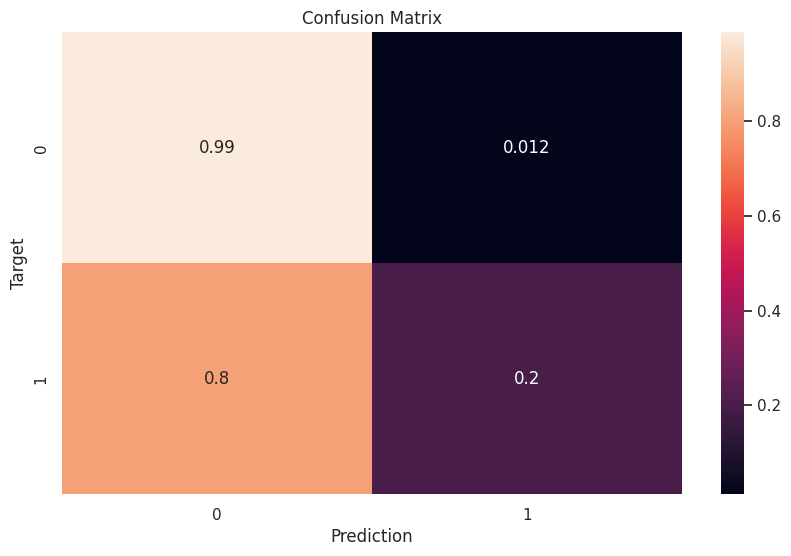

In [355]:
#ploting the heatmap
pred_plot(xgb.XGBClassifier, x_val, val_targets,'XgBoost')

# **CatBoost**

In [ ]:
#import library
from catboost import CatBoostClassifier

In [358]:
#checking accuray, precision on train dataset
predict_model(CatBoostClassifier, x_train, train_targets,'CatBoosting',learning_rate=0.01,verbose=False)

CatBoosting Accuracy: 94.105286%
CatBoosting Precision Score: 66.195255%
CatBoosting Recall Score: 21.347653%
CatBoosting F1 Score: 32.283903%


In [359]:
#checking accuray, precision on validation dataset
predict_model(CatBoostClassifier, x_val, val_targets,'CatBoosting',verbose=False)

CatBoosting Accuracy: 93.675434%
CatBoosting Precision Score: 54.397706%
CatBoosting Recall Score: 19.681771%
CatBoosting F1 Score: 28.905258%


CatBoosting Accuracy: 93.675434%


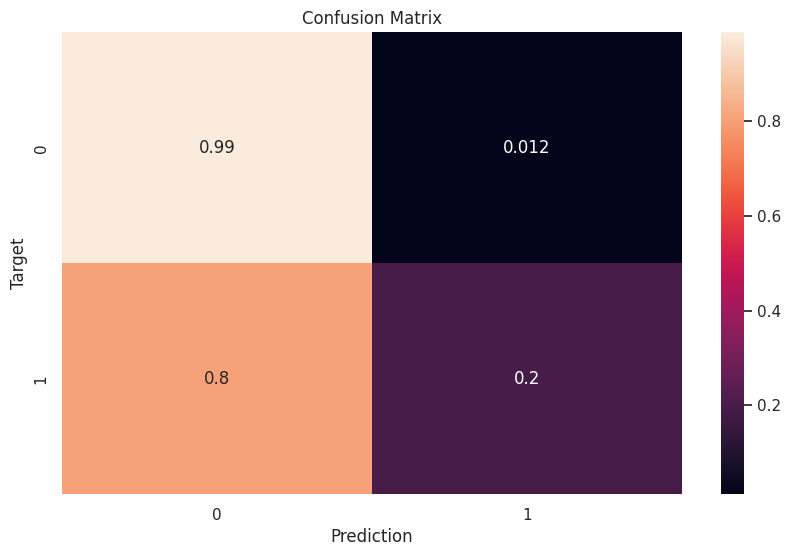

In [312]:
#ploting the heatmap
pred_plot(CatBoostClassifier, x_val, val_targets,'CatBoosting',verbose=False)

# **LightGBM**

In [313]:
#installing the library
!pip install lightgbm

#importing the library
import lightgbm as lgb

In [314]:
#creating a model
model = lgb.LGBMClassifier()

In [360]:
#checking accuray, precision on train dataset
predict_model(lgb.LGBMClassifier, x_train, train_targets,'LightGBM')

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6797, number of negative: 96465
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013388 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 971
[LightGBM] [Info] Number of data points in the train set: 103262, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.065823 -> initscore=-2.652699
[LightGBM] [Info] Start training from score -2.652699
LightGBM Accuracy: 94.297031%
LightGBM Precision Score: 71.234799%
LightGBM Recall Score: 22.406944%
LightGBM F1 Score: 34.090655%


In [361]:
#checking accuray, precision on validation dataset
predict_model(lgb.LGBMClassifier, x_val, val_targets,'LightGBM')

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6797, number of negative: 96465
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010276 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 971
[LightGBM] [Info] Number of data points in the train set: 103262, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.065823 -> initscore=-2.652699
[LightGBM] [Info] Start training from score -2.652699
LightGBM Accuracy: 93.865239%
LightGBM Precision Score: 59.887640%
LightGBM Recall Score: 18.436527%
LightGBM F1 Score: 28.193600%


## **Choosing  best model**

Let's check the scores of prediction on every model on Validation dataset

In [317]:
#checking accuray, precision on validation dataset
predict_model(LogisticRegression, x_val, val_targets,'Logistic validation',solver='liblinear')

Logistic validation Accuracy: 93.849422%
Logistic validation Precision Score: 0.632653%
Logistic validation Recall Score: 0.139398%
Logistic validation F1 Score: 0.228458%


In [318]:
#checking accuracy score after tuning best max_leaf_nodes and best max_depth on train dataset
predict_model(DecisionTreeClassifier, x_val, val_targets,'Decision Tree validation')

Decision Tree validation Accuracy: 89.872560%
Decision Tree validation Precision Score: 0.242640%
Decision Tree validation Recall Score: 0.259426%
Decision Tree validation F1 Score: 0.250752%


In [319]:
#checking the accuracy score afterr implimenting n_Estimators hypertunning on train datasetany
predict_model(RandomForestClassifier,x_val, val_targets,'Random Forest validation')

Random Forest validation Accuracy: 93.634761%
Random Forest validation Precision Score: 0.540130%
Random Forest validation Recall Score: 0.172259%
Random Forest validation F1 Score: 0.261212%


In [320]:
#checking accuray, precision on validation dataset
predict_model(CatBoostClassifier, x_val, val_targets,'CatBoosting',verbose=False)

CatBoosting Accuracy: 93.675434%
CatBoosting Precision Score: 0.543977%
CatBoosting Recall Score: 0.196818%
CatBoosting F1 Score: 0.289053%


In [321]:
#checking accuray, precision on validation dataset
predict_model(xgb.XGBClassifier, x_val, val_targets,'XgBoost')

XgBoost Accuracy: 93.637021%
XgBoost Precision Score: 0.534819%
XgBoost Recall Score: 0.199239%
XgBoost F1 Score: 0.290323%


In [322]:
#checking accuray, precision on validation dataset
predict_model(GradientBoostingClassifier, x_val, val_targets,'Gradient Boosting')

Gradient Boosting Accuracy: 93.851681%
Gradient Boosting Precision Score: 0.587629%
Gradient Boosting Recall Score: 0.197164%
Gradient Boosting F1 Score: 0.295260%


In [323]:
#checking accuray, precision on validation dataset
predict_model(lgb.LGBMClassifier, x_val, val_targets,'LightGBM')

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 6797, number of negative: 96465
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012413 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 971
[LightGBM] [Info] Number of data points in the train set: 103262, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.065823 -> initscore=-2.652699
[LightGBM] [Info] Start training from score -2.652699
LightGBM Accuracy: 93.865239%
LightGBM Precision Score: 0.598876%
LightGBM Recall Score: 0.184365%
LightGBM F1 Score: 0.281936%


We can see that GradientBoosting Classifier model is best model from all of other model. In GradientBoosting Classifier model, we are getting accuracy of 94.05% and Precision Score of 61 % which is better score then other models.

# **Hyper-Parameter Tunning**

# **Best Model**

choosing the best model

In [324]:
#importing the required library
from sklearn.model_selection import GridSearchCV

In [325]:
#creating the model
model = GradientBoostingClassifier()

In [326]:
#itting the train data into model
model.fit(x_train, train_targets)

GradientBoostingClassifier()

In [327]:
#predict the accuracy , precision on validation data
predict_model(GradientBoostingClassifier, x_val, val_targets,'Gradient Boosting', )

Gradient Boosting Accuracy: 93.849422%
Gradient Boosting Precision Score: 0.587024%
Gradient Boosting Recall Score: 0.197164%
Gradient Boosting F1 Score: 0.295184%


In [328]:
#passing the parameters
param_grid = {
    'loss': ['log_loss'],
    'learning_rate': [0.1],
    'n_estimators': [100,200],
    'subsample': [1.0],
    'criterion': ['friedman_mse'],
    'min_samples_split': [2],
    'min_samples_leaf': [6],
    'max_depth' :[3],
    'min_impurity_decrease': [0.5],
    'max_features':[2,8,10,12],
    'max_leaf_nodes':[2,4,6,8]
}

In [329]:
#searching best parameters for hyper parameter tunning
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3,verbose=2,n_jobs=-1, scoring='accuracy')

In [330]:
grid_search.fit(x_train, train_targets)

Fitting 3 folds for each of 32 candidates, totalling 96 fits


GridSearchCV(cv=3, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'criterion': ['friedman_mse'], 'learning_rate': [0.1],
                         'loss': ['log_loss'], 'max_depth': [3],
                         'max_features': [2, 8, 10, 12],
                         'max_leaf_nodes': [2, 4, 6, 8],
                         'min_impurity_decrease': [0.5],
                         'min_samples_leaf': [6], 'min_samples_split': [2],
                         'n_estimators': [100, 200], 'subsample': [1.0]},
             scoring='accuracy', verbose=2)

In [331]:
#checking the best parameters
grid_search.best_params_

{'criterion': 'friedman_mse',
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': 12,
 'max_leaf_nodes': 6,
 'min_impurity_decrease': 0.5,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'n_estimators': 100,
 'subsample': 1.0}

In [333]:
#checking the score of validation
predict_model(GradientBoostingClassifier, x_val, val_targets,'Gradient Boosting',criterion='friedman_mse',learning_rate= 0.1,loss= 'log_loss',n_estimators= 100,subsample= 1.0,min_samples_leaf= 6,min_samples_split= 2)

Gradient Boosting Accuracy: 93.847162%
Gradient Boosting Precision Score: 0.586066%
Gradient Boosting Recall Score: 0.197855%
Gradient Boosting F1 Score: 0.295837%


## **Test Dataset**

In [334]:
#checking the test dataset
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101503 entries, 0 to 101502
Data columns (total 12 columns):
 #   Column                                Non-Null Count   Dtype   
---  ------                                --------------   -----   
 0   SeriousDlqin2yrs                      0 non-null       float64 
 1   RevolvingUtilizationOfUnsecuredLines  101503 non-null  float64 
 2   age                                   101503 non-null  int64   
 3   NumberOfTime30-59DaysPastDueNotWorse  101503 non-null  int64   
 4   DebtRatio                             101503 non-null  float64 
 5   MonthlyIncome                         101503 non-null  float64 
 6   NumberOfOpenCreditLinesAndLoans       101503 non-null  int64   
 7   NumberOfTimes90DaysLate               101503 non-null  int64   
 8   NumberRealEstateLoansOrLines          101503 non-null  int64   
 9   NumberOfTime60-89DaysPastDueNotWorse  101503 non-null  int64   
 10  NumberOfDependents                    101503 non-null  f

In [335]:
#creating the model
model_gb = GradientBoostingClassifier(criterion='friedman_mse',learning_rate= 0.1,
                                      loss= 'log_loss',n_estimators= 100,subsample= 1.0,
                                      min_samples_leaf= 6,min_samples_split= 2)

In [336]:
#fiting the data into model
model_gb.fit(x_train,train_targets)

GradientBoostingClassifier(min_samples_leaf=6)

In [337]:
#predict the prediction
test_preds = model_gb.predict(x_test)
test_preds

array([1, 0, 0, ..., 0, 1, 0])

In [338]:
#getting submission dataset
submission_df = pd.read_csv("/content/GiveMeSomeCredit/sampleEntry.csv")

In [339]:
submission_df['Probability'] = test_preds

In [340]:
submission_df.to_csv('new_Credit_pred.csv',index=False)

# **Kaggle Submission**

![](https://i.imgur.com/8tzjbwj.png)




After reviewing the private leaderboard, I've observed that my current position ranks among the top 6% on the Kaggle leaderboard.

# **Summary**




In this project we solved a classification problem with credit card default payment using the 'Give Me Some Credit' at Kaggle.com. With the existing dataset, we learned how to split the dataset into training and validation and submit predictions with the best model using the given test dataset. We used Pandas, Numpy, Matplotlib, Seaborn and Plotly to perform the exploratory data analysis and gather insights for machine learning. We implemented multiple Machine learning algorithms like RandomForest, CatBoostClassifier, XGBClassifier,GradientBoostingClassifier, LGBMClassifier were trained to predict Froud detection using Scikit Learn.For us gradient Boosting worked out the best giving us a whoping validation accuracy of 93.84% and landing me in top 6% of the private leaderboard which is something.

* Our dataset had 150K rows and 12 columns.
* Our model training utilized a dataset that displayed significant skewness, characterized by a substantial imbalance and irregular distribution of values, encompassing both prominent outliers and notably small data points. In an effort to address this issue.
* GradientBoostingClassifier performed better than any other model. While we can tune the hyperparameters to reduce overfitting we can also use more powerful ensemble models.

* GradientBoostingClassifier performed the best with simple inputs and some hyperparameter tuning
            (criterion='friedman_mse',learning_rate= 0.1,
              loss= 'log_loss',n_estimators= 100,subsample= 1.0,
              min_samples_leaf= 6,min_samples_split= 2 ) or feature engineering.

* Feature Engineering: We experimented with various features based on EDA for age, NumberOfTime30-59DaysPastDueNotWorse, DebtRatio, MonthlyIncome,NumberOfOpenCreditLinesAndLoans, NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfDependents etc.
* GradientBoostingClassifier had the best performance after hyperparameter tuning
Hyperparameters: riterion='friedman_mse',learning_rate= 0.1, loss= 'log_loss',n_estimators= 100,subsample= 1.0,min_samples_leaf= 6,min_samples_split= 2
* Best Predictors of House Pricing were:-
![](https://i.imgur.com/u0fmPIQ.png)


# **Learning & Limitaions**

* Start with simplest 4-5 features and select a model without hyperparameter tuning.

* My first approach was heavily feature engineered, the LightGBM worked very well on the train data but performed very poorly on the validation dataset.
* Train, Val split should be carefully considered to mirror the test set or real world scenario.

* The best split was 70:30
* Feature Selection and Encoding of
 Nominal columns
* RevolvingUtilizationofUnsecuredLines, DebtRatio and monthlyIncome seem to have significant predictive power. which are very important in terms of Froud detection. It is also likely that the models are assigning importance based on these values. These features improved model performance.

**Comparing and Contrasting Ensemble models Random Forest, Logistic Regressor, Decision Tree, CatBoostClassifier, XGBClassifier, GradientBoostingClassifier and LGBMClassifier compare and contrast?**
![](https://i.imgur.com/2zFVpGz.png)


Gradient Boosting had the best performance but as we can see from the stats above LightGBM, RandomForest and Decision Tree Regressor model can be nearly as good with the right hyperparameter tuning.

# **Suggestions for Future Work**

* Feature selection techniques such as PCA, Autoencoders etc
* Tune Lasso, Ridge, SGD models.
* Optimal Hyperparameter tuning for example with RandomSearchCV
* Neural Network models such as LSTM
* Remove outliers and perform  interventions post prediction
* Stacking models
* Cleaner and more robust pipeline for transformation
* Compare and contrast ARIMA, Prophet, Classical Machine Learning and Neural Network models

# **Tutorials**

* Linear Regression with Scikit-Learn:- [Machine Learing by jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp)
* How to approach Machine Learning Problems:- [Machine Learing by jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp)
* Gradient Boosting Machines with XGBoost:- [Machine Learing by jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp)